In [ ]:
import pickle
import numpy as np
import pandas as pd

input_file = "/content/image_face_embeddings_data.pkl"

with open(input_file, "rb") as f:
    database = pickle.load(f)

labels_list = []
embeddings_list = []
paths_list = []

for person, info in database.items():
    embs = info.get("embeddings", [])
    paths = info.get("paths", [None]*len(embs))

    for e, p in zip(embs, paths):
        labels_list.append(person)
        embeddings_list.append(np.array(e).flatten())
        paths_list.append(p)

loaded_embeddings = np.array(embeddings_list)
loaded_labels = labels_list
loaded_paths = paths_list

print(f"Loaded {len(loaded_labels)} embeddings")
print("Example labels:", loaded_labels[:5])
print("Embedding shape:", loaded_embeddings.shape)

# Optional DataFrame
df = pd.DataFrame({
    "person": loaded_labels,
    "embedding": list(loaded_embeddings),
    "path": loaded_paths
})
print(f"DataFrame entries: {len(df)}")
print(df.head())


Loaded 84 embeddings
Example labels: ['Brian May', 'Brian May', 'Brian May', 'Brian May', 'Brian May']
Embedding shape: (84, 512)
DataFrame entries: 84
      person                                          embedding  \
0  Brian May  [-0.013235701, -0.0445081, -0.0461692, 0.00695...   
1  Brian May  [-0.006927651, -0.027044175, -0.010292458, 0.0...   
2  Brian May  [-0.025595661, -0.070522346, 0.013632908, 0.02...   
3  Brian May  [-0.040715236, -0.044822466, -0.07107714, -0.0...   
4  Brian May  [-0.02008038, 0.00810217, -0.013255156, 0.0407...   

                                                path  
0  /content/sample dataset/Brian May/brian may 8 ...  
1  /content/sample dataset/Brian May/Brian may 2.jpg  
2  /content/sample dataset/Brian May/brian may 3.jpg  
3  /content/sample dataset/Brian May/brian may 10...  
4  /content/sample dataset/Brian May/Brian may 6.jpg  


In [ ]:
!unzip "/content/sample dataset.zip"

Archive:  /content/sample dataset.zip
   creating: sample dataset/
   creating: sample dataset/Brian May/
  inflating: sample dataset/Brian May/brian may 10 young.jpg  
  inflating: sample dataset/Brian May/Brian may 2.jpg  
  inflating: sample dataset/Brian May/brian may 3.jpg  
  inflating: sample dataset/Brian May/brian may 4.jpg  
  inflating: sample dataset/Brian May/brian may 5 young.jpg  
  inflating: sample dataset/Brian May/Brian may 6.jpg  
  inflating: sample dataset/Brian May/brian may 7 young.jpg  
  inflating: sample dataset/Brian May/brian may 8 young.jpg  
  inflating: sample dataset/Brian May/brian may 9.jpg  
  inflating: sample dataset/Brian May/Brian may.jpg  
   creating: sample dataset/Carlos Santana/
  inflating: sample dataset/Carlos Santana/carlos santana 10.jpg  
  inflating: sample dataset/Carlos Santana/carlos santana 2.jpg  
  inflating: sample dataset/Carlos Santana/carlos santana 3 young.jpg  
  inflating: sample dataset/Carlos Santana/carlos santana 4.jp

In [ ]:
import os

count = 0
for root, dirs, files in os.walk("/content/sample dataset"):
    for f in files:
        count += 1

print("Total images found:", count)


Total images found: 98


In [ ]:
!uv pip install insightface onnxruntime numpy matplotlib

from insightface.app import FaceAnalysis # Correct import for FaceAnalysis
from sklearn.metrics.pairwise import cosine_similarity

# Initialize the FaceAnalysis app
# Providers can be 'CPUExecutionProvider' or 'CUDAExecutionProvider' if GPU is available
app = FaceAnalysis(name='buffalo_l', providers=['CPUExecutionProvider'])
app.prepare(ctx_id=-1, det_size=(640, 640)) # Prepare the model, ctx_id=0 for CPU

Using Python 3.12.12 environment at: /usr
Resolved 49 packages in 4.69s
Prepared 3 packages in 8.15s
Installed 3 packages in 375ms
 + insightface==0.7.3
 + onnx==1.20.1
 + onnxruntime==1.24.1
download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:05<00:00, 50103.00KB/s]


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (640, 640)


Image to Enrolled image


In [ ]:
#image vs enrolled images function
import cv2
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

def search_faces_and_return_matches(
    query_img,
    enrolled_embeddings,
    enrolled_paths,
    enrolled_labels=None,
    threshold=0.5
):
    """
    Search query image faces against enrolled face embeddings.
    Returns matched dataset images and metadata.
    """

    # Load query image
    if isinstance(query_img, str):
        query_img = cv2.imread(query_img)

    if query_img is None:
        raise ValueError("Could not read query image")

    # Detect faces in query image
    query_faces = app.get(query_img)
    print(f"Detected {len(query_faces)} face(s) in query image")

    enrolled_embeddings = np.array(enrolled_embeddings)

    results = []

    for q_id, face in enumerate(query_faces):
        if face.normed_embedding is None:
            continue

        # Compute similarity vs enrolled embeddings
        scores = cosine_similarity(
            face.normed_embedding.reshape(1, -1),
            enrolled_embeddings
        )[0]

        best_idx = np.argmax(scores)
        best_score = scores[best_idx]

        if best_score < threshold:
            continue  # no sufficiently similar face

        # Load matched dataset image
        matched_img = cv2.imread(enrolled_paths[best_idx])

        results.append({
            "query_face_id": q_id,
            "score": float(best_score),
            "dataset_path": enrolled_paths[best_idx],
            "label": enrolled_labels[best_idx] if enrolled_labels is not None else None,
            "matched_image": matched_img
        })

    return results


Query image:


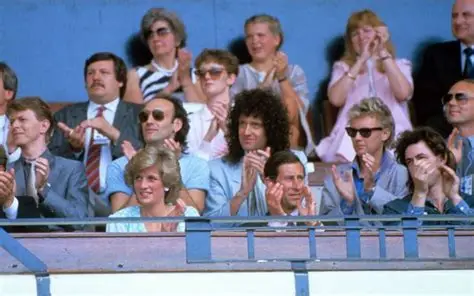

Detected 14 face(s) in query image
Query face 9 → Brian May | score=0.51 | path=/content/sample dataset/Brian May/brian may 5 young.jpg


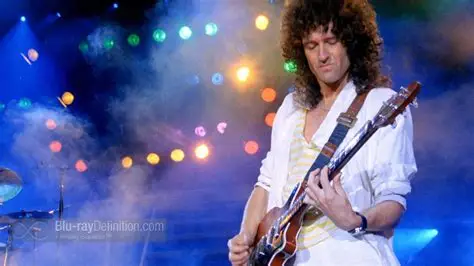

In [ ]:
#compare and obtain known faces

from google.colab.patches import cv2_imshow
import cv2

# Show query image
query_img = cv2.imread("/content/live aid photo.jpg")
print("Query image:")
cv2_imshow(query_img)

matches = search_faces_and_return_matches(
    query_img,
    loaded_embeddings,
    loaded_paths,
    enrolled_labels=loaded_labels,  # optional
    threshold=0.5
)

for m in matches:
    print(
        f"Query face {m['query_face_id']} → "
        f"{m['label']} | score={m['score']:.2f} | path={m['dataset_path']}"
    )
    cv2_imshow(m["matched_image"])


In [ ]:
#compare two arbitrary images

from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import cv2

def image_to_image_face_match(img1, img2, threshold=0.5):
    """
    Compare faces in img1 against faces in img2.
    Returns list of matches with similarity scores.
    """

    # Load images
    if isinstance(img1, str):
        img1 = cv2.imread(img1)
    if isinstance(img2, str):
        img2 = cv2.imread(img2)

    if img1 is None or img2 is None:
        raise ValueError("Could not read one of the images")

    # Detect faces
    faces1 = app.get(img1)
    faces2 = app.get(img2)

    print(f"Image 1 faces: {len(faces1)}")
    print(f"Image 2 faces: {len(faces2)}")

    if len(faces1) == 0 or len(faces2) == 0:
        return []

    # Extract embeddings
    emb1 = np.array([f.normed_embedding for f in faces1 if f.normed_embedding is not None])
    emb2 = np.array([f.normed_embedding for f in faces2 if f.normed_embedding is not None])

    # Compute similarity matrix
    sim_matrix = cosine_similarity(emb1, emb2)

    matches = []
    for i in range(sim_matrix.shape[0]):
        for j in range(sim_matrix.shape[1]):
            score = sim_matrix[i, j]
            if score >= threshold:
                matches.append({
                    "face_img1": i,
                    "face_img2": j,
                    "similarity": float(score)
                })

    return matches


Image to video search


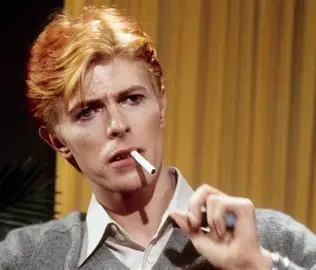

Loaded 583 video face embeddings

Matched frames:
Frame 0 | similarity=0.569
Frame 1 | similarity=0.569
Frame 2 | similarity=0.560
Frame 3 | similarity=0.567
Frame 4 | similarity=0.569
Frame 5 | similarity=0.567
Frame 6 | similarity=0.559
Frame 7 | similarity=0.566
Frame 8 | similarity=0.536
Frame 9 | similarity=0.568


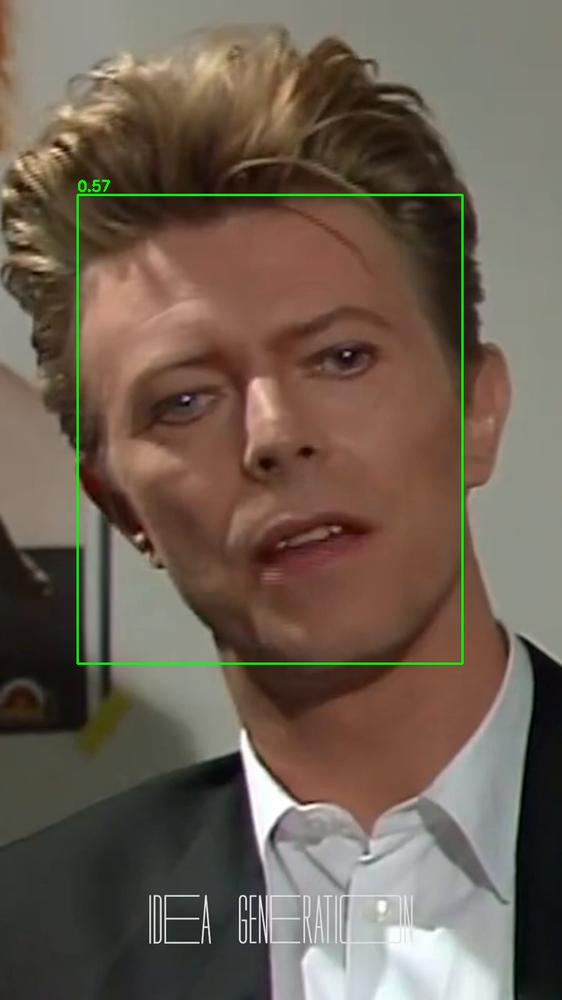

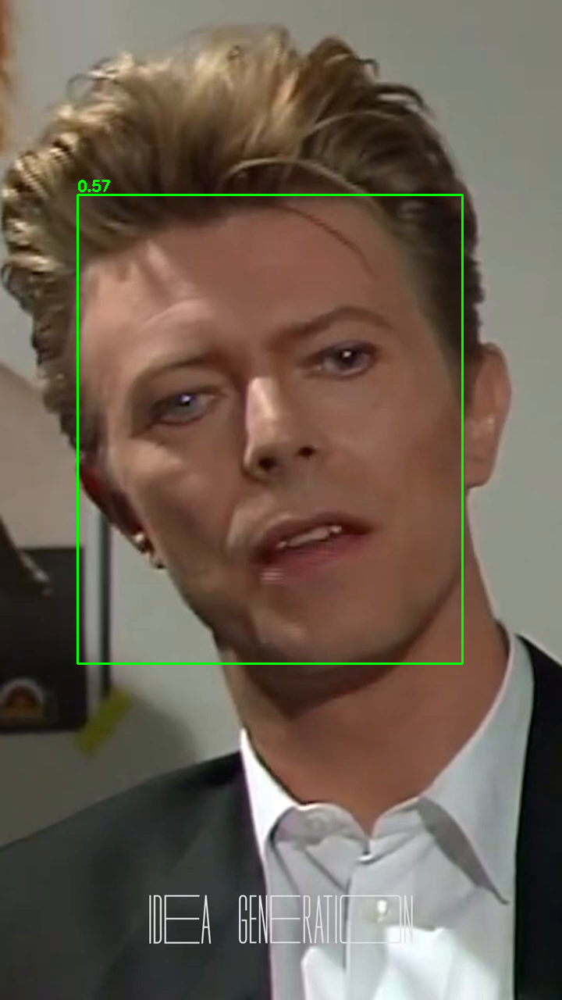

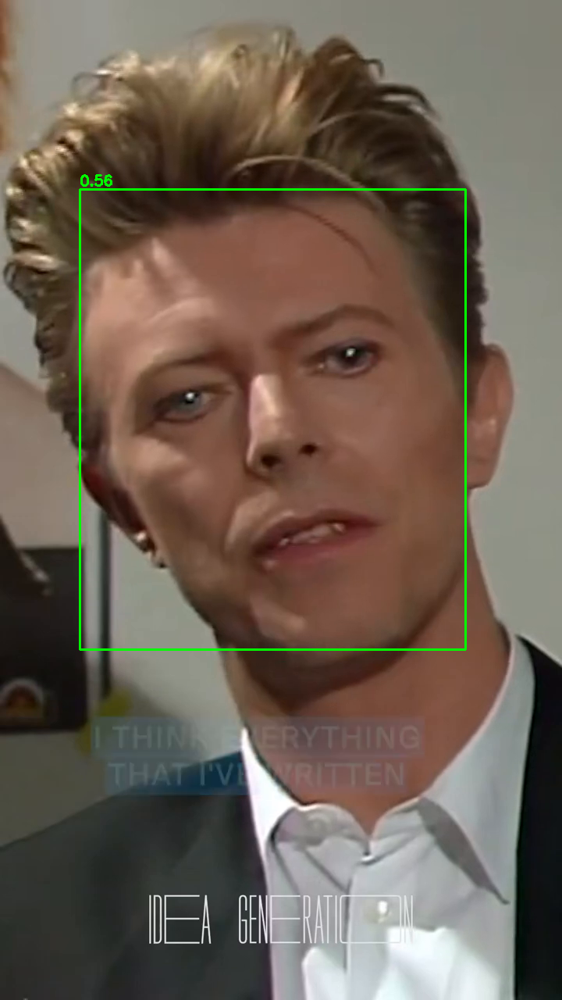

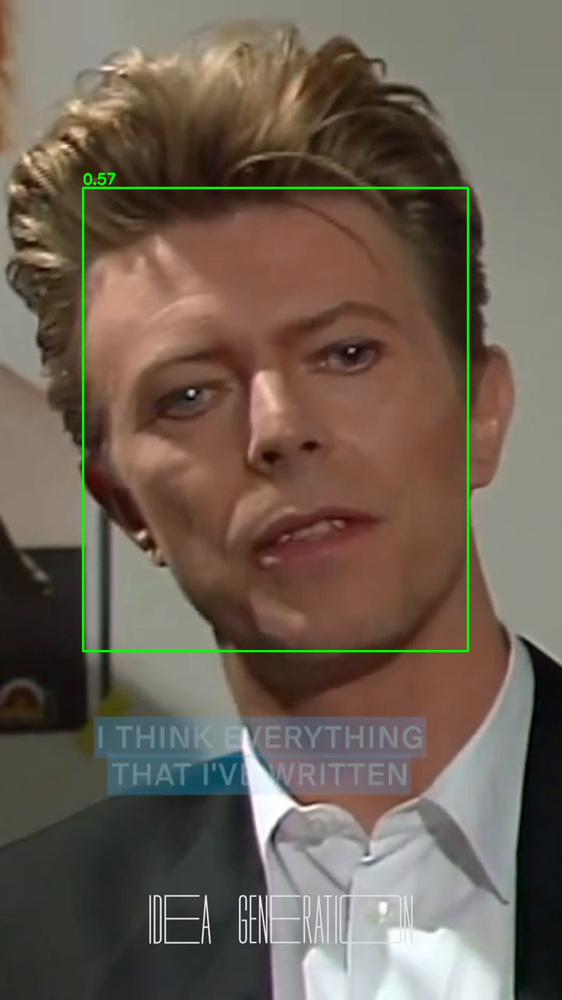

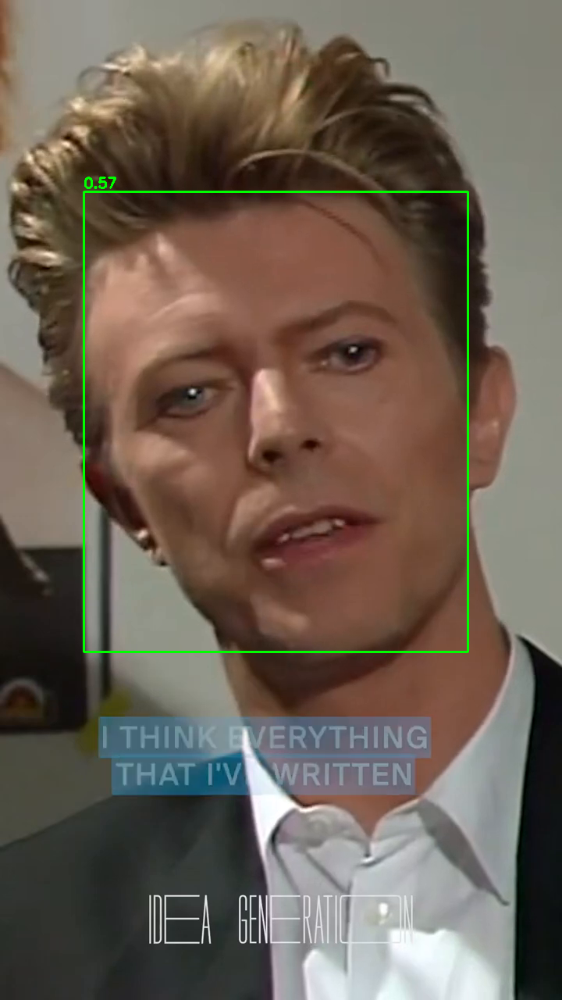

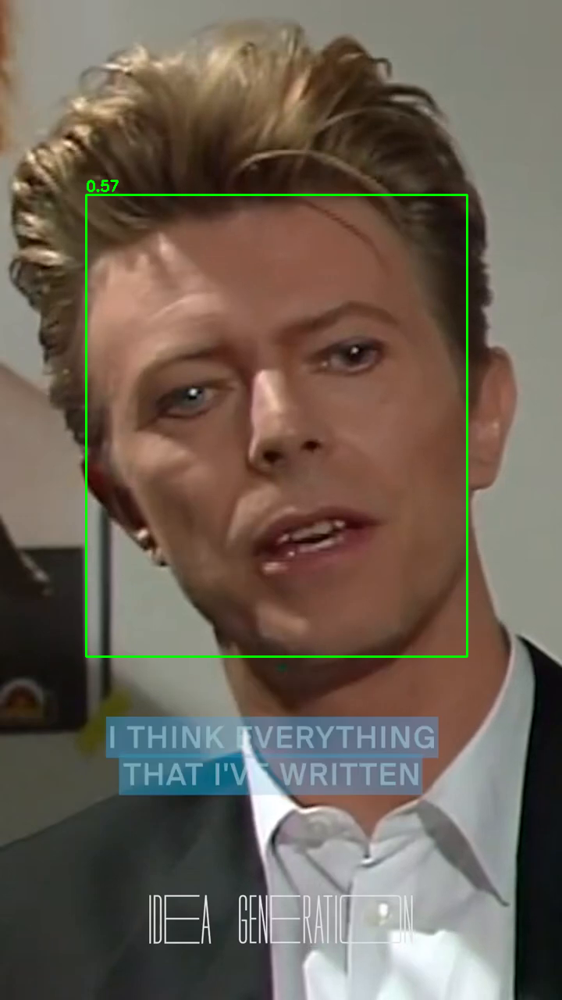

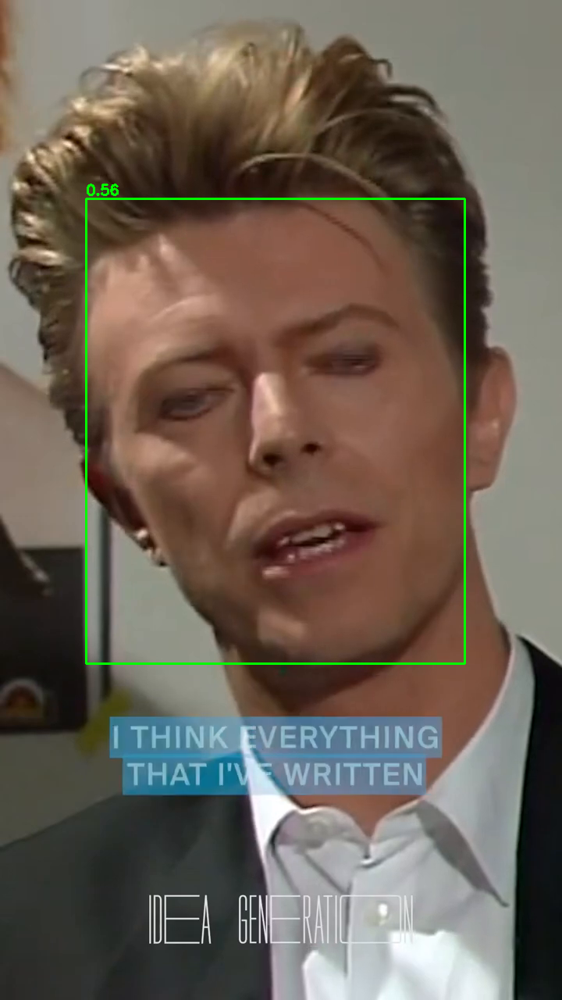

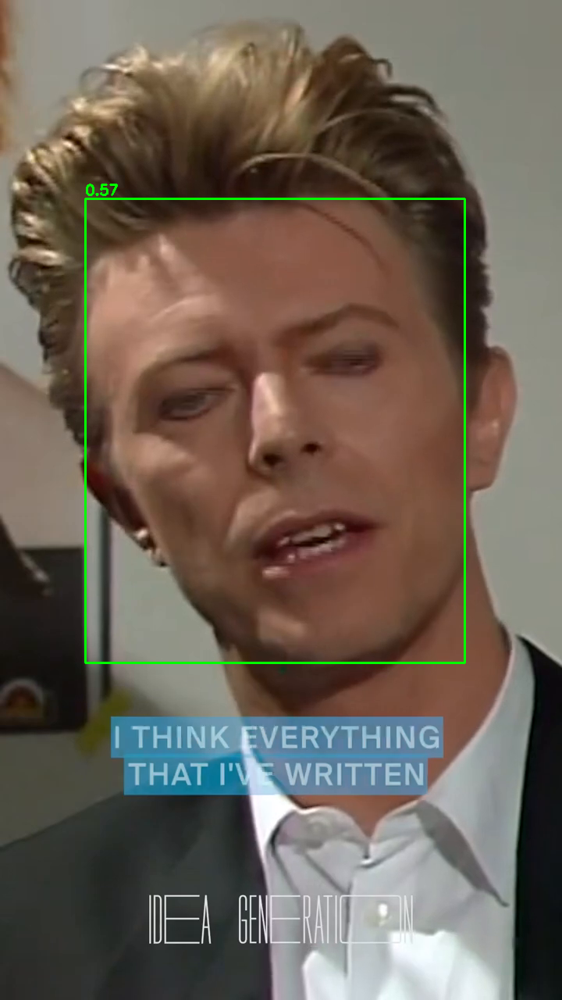

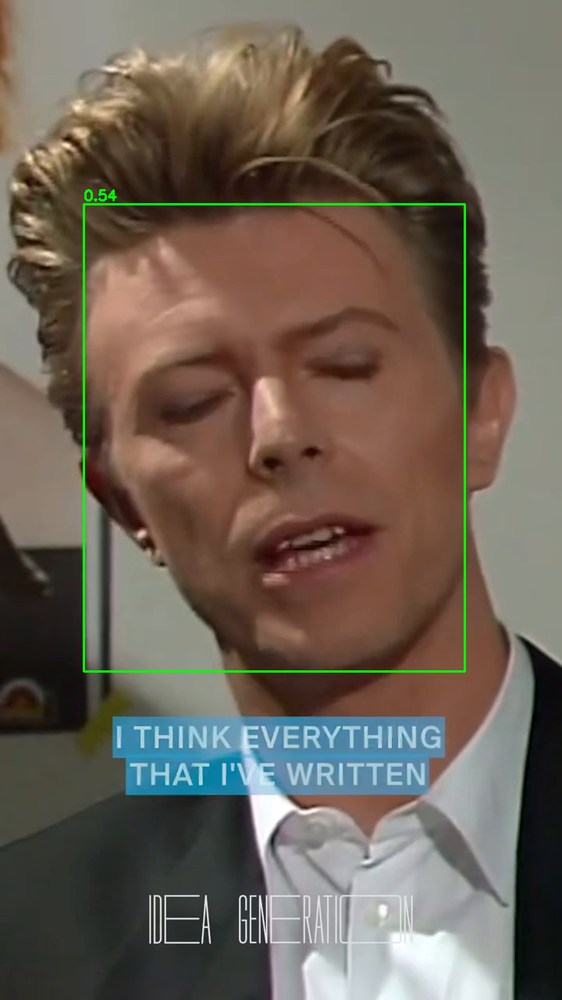

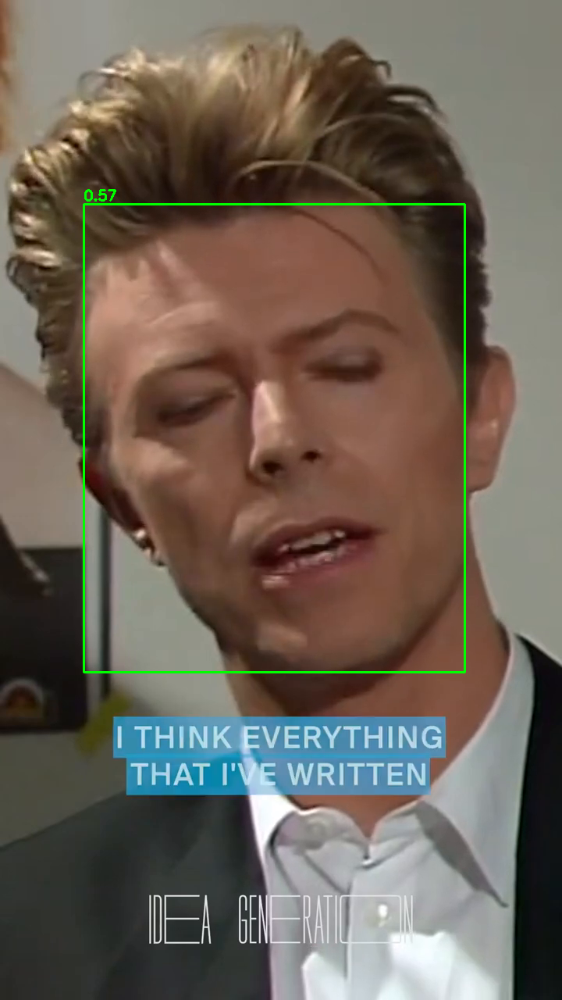

In [ ]:
import pickle
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# -----------------------------
# Parameters
# -----------------------------
QUERY_IMAGE = "/content/david bowie sample.jpg"
VIDEO_ENROLLMENT_FILE = "/content/David Bowie on Balancing Emotion and Intelligence When Creating_enrollment.pkl"
VIDEO_FILE = "/content/David Bowie on Balancing Emotion and Intelligence When Creating.mp4"

SIM_THRESHOLD = 0.35  # minimum similarity to consider a match
TOP_K = 10             # max frames to visualize

# -----------------------------
# 1️⃣ Load query image
# -----------------------------
query_img = cv2.imread(QUERY_IMAGE)
if query_img is None:
    raise ValueError("Could not read query image")

cv2_imshow(query_img)

query_faces = app.get(query_img)
if len(query_faces) == 0:
    raise ValueError("No face detected in query image")

# pick largest face
query_face = max(
    query_faces,
    key=lambda f: (f.bbox[2] - f.bbox[0]) * (f.bbox[3] - f.bbox[1])
)

# already normalized
query_embedding = query_face.normed_embedding.reshape(1, -1)

# -----------------------------
# 2️⃣ Load video embeddings
# -----------------------------
with open(VIDEO_ENROLLMENT_FILE, "rb") as f:
    video_data = pickle.load(f)

video_embeddings = np.asarray(video_data["embeddings"])
frames_info = video_data["frames_info"]

# sanity check
norms = np.linalg.norm(video_embeddings, axis=1)
assert np.allclose(norms, 1.0, atol=1e-3), "Video embeddings are not normalized"

print(f"Loaded {len(video_embeddings)} video face embeddings")

# -----------------------------
# 3️⃣ Cosine similarity (dot product)
# -----------------------------
similarities = np.dot(video_embeddings, query_embedding.T).squeeze()

# filter by threshold
matched_idx = np.where(similarities >= SIM_THRESHOLD)[0]

if len(matched_idx) == 0:
    print("No matches above threshold")
else:
    # sort by frame number
    matched_idx = matched_idx[np.argsort([frames_info[i]['frame_idx'] for i in matched_idx])]

    # limit to TOP_K
    matched_idx = matched_idx[:TOP_K]

    print("\nMatched frames:")
    for idx in matched_idx:
        record = frames_info[idx]
        print(f"Frame {record['frame_idx']} | similarity={similarities[idx]:.3f}")

# -----------------------------
# 4️⃣ Visualize matches
# -----------------------------
cap = cv2.VideoCapture(VIDEO_FILE)
if not cap.isOpened():
    raise ValueError("Could not open video file")

for idx in matched_idx:
    record = frames_info[idx]
    frame_id = record['frame_idx']
    bbox = np.array(record['bbox'], dtype=int)
    score = similarities[idx]

    cap.set(cv2.CAP_PROP_POS_FRAMES, frame_id)
    ret, frame = cap.read()
    if not ret:
        continue

    x1, y1, x2, y2 = bbox
    cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
    cv2.putText(
        frame,
        f"{score:.2f}",
        (x1, y1 - 5),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.6,
        (0, 255, 0),
        2
    )

    cv2_imshow(frame)

cap.release()


In [ ]:
#compares two video embedding pickle files, needs to be improved, as image -> video is already implemented
import pandas as pd
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
import pickle

# -------------------------------
# Load video enrollment pickle
# -------------------------------
VIDEO_ENROLLMENT_FILE = "/content/Personal Tragedy and Resilience with Ozzy Osbourne on Letterman 1982_enrollment.pkl"

with open(VIDEO_ENROLLMENT_FILE, "rb") as f:
    video_data = pickle.load(f)

# Extract embeddings and frame info
video_embeddings = np.stack(video_data["embeddings"])  # (num_faces, 512)
frames_info = video_data["frames_info"]                # list of dicts: frame_idx, bbox

num_frames = len(video_embeddings)

# -------------------------------
# Create DataFrame
# -------------------------------
df = pd.DataFrame({
    "video_id": ["David Letterman Ozzy Osbourne interview"] * num_frames,
    "frame_no": [info["frame_idx"] for info in frames_info],
    "bbox": [info["bbox"] for info in frames_info],
    "embedding": list(video_embeddings)
})

print(df.head())

# -------------------------------
# Image → Video comparison
# -------------------------------
# Assuming you have image_df with query embeddings
# Example: image_df["embedding"].values is a list of 512-D vectors
image_embeddings = np.vstack(image_df["embedding"].values)   # (num_query, 512)
video_embeddings_matrix = np.vstack(df["embedding"].values)  # (num_faces, 512)

# Compute cosine similarity
similarity = cosine_similarity(image_embeddings, video_embeddings_matrix)

# Attach similarity scores to DataFrame
# If single query image, take first row
df["image_similarity"] = similarity[0]

# -------------------------------
# Inspect top matches
# -------------------------------
print(df.sort_values("image_similarity", ascending=False).head(10))

                                  video_id  frame_no                  bbox  \
0  David Letterman Ozzy Osbourne interview         0  [295, 192, 421, 383]   
1  David Letterman Ozzy Osbourne interview         1  [295, 192, 421, 383]   
2  David Letterman Ozzy Osbourne interview         2  [296, 194, 422, 384]   
3  David Letterman Ozzy Osbourne interview         3  [297, 195, 423, 387]   
4  David Letterman Ozzy Osbourne interview         4  [297, 197, 423, 388]   

                                           embedding  
0  [-0.03226995, -0.04079978, 0.0740478, -0.02448...  
1  [-0.0323261, -0.041261647, 0.07398753, -0.0242...  
2  [-0.034025397, -0.050862115, 0.08426537, -0.01...  
3  [-0.032345288, -0.046658427, 0.06057793, -0.02...  
4  [-0.042838946, -0.055202704, 0.06665632, -0.01...  
                                    video_id  frame_no                  bbox  \
56   David Letterman Ozzy Osbourne interview        56  [126, 239, 490, 753]   
55   David Letterman Ozzy Osbourne interv

Video to video search


In [ ]:
!unzip "/content/face_cache.zip"

Archive:  /content/face_cache.zip
   creating: content/face_cache/
  inflating: content/face_cache/231eb10e7ab4e694a0ffde1b254c7fa4.pkl  
   creating: content/face_cache/tracks/
  inflating: content/face_cache/tracks/8337e298fa8a52ce728312e8b44edf76.pkl  
  inflating: content/face_cache/tracks/8cc190441340576371e837d7baab3a4d.pkl  
  inflating: content/face_cache/d022bc3f4bf34843f3ce85864d26b587.pkl  
   creating: content/face_cache/video_embeddings/


In [ ]:
# =====================================
# VIDEO-TO-VIDEO MULTI-FACE MATCHING
# (InsightFace + IoU Tracking)
# =====================================

import cv2
import numpy as np
from insightface.app import FaceAnalysis
from sklearn.metrics.pairwise import cosine_similarity
from tqdm import tqdm
from google.colab.patches import cv2_imshow
import os
import subprocess



# -----------------------------
# PARAMETERS
# -----------------------------
QUERY_VIDEO  = "/content/David Bowie - Backstage Interview (Live Aid 1985).mp4"
TARGET_VIDEO = "/content/David Bowie - TVC 15 (Live Aid 1985).mp4"

FRAME_INTERVAL = 5
IOU_THRESHOLD = 0.4
EMB_SIM_THRESHOLD = 0.65
MAX_MISSES = 3 * FRAME_INTERVAL
MIN_TRACK_LENGTH = max(3, FRAME_INTERVAL // 2)
TOP_K = 10

# -----------------------------
# LOAD INSIGHTFACE
# -----------------------------
app = FaceAnalysis(name="buffalo_l")
app.prepare(ctx_id=0, det_size=(1280, 1280))


# -----------------------------
# IOU FUNCTION
# -----------------------------
def iou(a, b):
    xA = max(a[0], b[0])
    yA = max(a[1], b[1])
    xB = min(a[2], b[2])
    yB = min(a[3], b[3])
    inter = max(0, xB - xA) * max(0, yB - yA)
    areaA = (a[2]-a[0]) * (a[3]-a[1])
    areaB = (b[2]-b[0]) * (b[3]-b[1])
    return inter / (areaA + areaB - inter + 1e-6)


# -----------------------------
# TRACK + AGGREGATE FACES
# -----------------------------
def extract_tracked_embeddings(video_path):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"❌ Cannot open video: {video_path}")
        return []

    total = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    pbar = tqdm(total=total, desc=f"Processing {os.path.basename(video_path)}")

    active_tracks = []
    finished_tracks = []
    next_id = 0
    frame_id = 0

    ret, first_frame = cap.read()
    if not ret:
        cap.release()
        pbar.close()
        print(f"⚠️ Could not read first frame from {video_path}")
        return []

    h, w = first_frame.shape[:2]
    min_face_size = max(20, int(0.03 * min(h, w)))
    cap.set(cv2.CAP_PROP_POS_FRAMES, 0)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        pbar.update(1)

        if frame_id % FRAME_INTERVAL != 0:
            frame_id += 1
            continue

        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        faces = app.get(frame_rgb)

        detections = []
        for face in faces:
            x1, y1, x2, y2 = face.bbox.astype(int)
            if (x2 - x1) < min_face_size or (y2 - y1) < min_face_size:
                continue

            emb = face.embedding
            emb = emb / np.linalg.norm(emb)

            detections.append({
                "bbox": np.array([x1, y1, x2, y2]),
                "embedding": emb
            })

        for track in active_tracks:
            track["matched"] = False

        pre_existing_ids = {id(t) for t in active_tracks}

        # -------- MATCHING (CORRECTLY NESTED) --------
        for det in detections:
            best_score = 0
            best_track = None

            for track in active_tracks:
                if track["matched"]:
                    continue

                iou_score = iou(det["bbox"], track["bbox"])
                emb_score = float(np.dot(det["embedding"], track["embeddings"][-1]))
                score = max(iou_score, emb_score)

                if score > best_score:
                    best_score = score
                    best_track = track

            if best_track is not None and (
                iou(det["bbox"], best_track["bbox"]) >= IOU_THRESHOLD
                or np.dot(det["embedding"], best_track["embeddings"][-1]) >= EMB_SIM_THRESHOLD
            ):
                best_track["bbox"] = det["bbox"]
                best_track["embeddings"].append(det["embedding"])
                best_track["frames"].append(frame_id)
                best_track["misses"] = 0
                best_track["matched"] = True
            else:
                active_tracks.append({
                    "id": next_id,
                    "bbox": det["bbox"],
                    "embeddings": [det["embedding"]],
                    "frames": [frame_id],
                    "misses": 0,
                    "matched": True
                })
                next_id += 1

        # -------- MISS UPDATE --------
        for track in active_tracks:
            if id(track) in pre_existing_ids and not track["matched"]:
                track["misses"] += 1

        # -------- PRUNING --------
        still_active = []
        for track in active_tracks:
            if track["misses"] <= MAX_MISSES:
                still_active.append(track)
            else:
                finished_tracks.append(track)

        active_tracks = still_active
        frame_id += 1

    cap.release()
    pbar.close()

    finished_tracks.extend(active_tracks)

    # -------- AGGREGATION --------
    final_tracks = []
    for t in finished_tracks:
        if len(t["embeddings"]) < MIN_TRACK_LENGTH:
            continue

        emb = np.mean(t["embeddings"], axis=0)
        emb = emb / np.linalg.norm(emb)

        final_tracks.append({
            "embedding": emb,
            "rep_frame": int(np.median(t["frames"])),
            "track_id": t["id"],
            "length": len(t["embeddings"])
        })

    return final_tracks


Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /root/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.5 127.5
set det-size: (1280, 1280)


In [ ]:
#---- load or extract face cache tracks

import hashlib
import os

CACHE_ROOT = "/content/face_cache"
TRACK_DIR = os.path.join(CACHE_ROOT, "tracks")
VIDEO_EMB_DIR = os.path.join(CACHE_ROOT, "video_embeddings")

os.makedirs(TRACK_DIR, exist_ok=True)
os.makedirs(VIDEO_EMB_DIR, exist_ok=True)


def get_video_hash(video_path, model_name="buffalo_l"):
    key = f"{video_path}_{model_name}"
    return hashlib.md5(key.encode()).hexdigest()


def get_tracks(video_path, model_name="buffalo_l"):
    video_hash = get_video_hash(video_path, model_name)

    # Try loading cached tracks
    cached_tracks = load_tracks(video_hash)
    if cached_tracks is not None:
        return cached_tracks

    # Otherwise extract
    print("🔍 Extracting embeddings...")
    tracks = extract_tracked_embeddings(video_path)

    # Save to cache
    save_tracks(video_hash, tracks)

    return tracks



#------  STEP 2: TRACK CACHE FUNCTIONS

import pickle

def save_tracks(video_hash, tracks):
    path = os.path.join(TRACK_DIR, f"{video_hash}.pkl")
    with open(path, "wb") as f:
        pickle.dump(tracks, f)


def load_tracks(video_hash):
    path = os.path.join(TRACK_DIR, f"{video_hash}.pkl")
    if os.path.exists(path):
        print("⚡ Loading cached tracks")
        with open(path, "rb") as f:
            return pickle.load(f)
    return None

#----- STEP 3: VIDEO LEVEL EMBEDDING CACHE

AGG_VERSION = "dominant_v1"

def save_video_embedding(video_hash, embedding):
    path = os.path.join(VIDEO_EMB_DIR, f"{video_hash}_{AGG_VERSION}.npy")
    np.save(path, embedding)


def load_video_embedding(video_hash):
    path = os.path.join(VIDEO_EMB_DIR, f"{video_hash}_{AGG_VERSION}.npy")
    if os.path.exists(path):
        print("⚡ Loading cached video embedding")
        return np.load(path)
    return None

#----- STEP 4: UNIFIED VIDEO EMBEDDING GETTER

def get_video_embedding(video_path, model_name="buffalo_l"):
    video_hash = get_video_hash(video_path, model_name)

    # Try loading aggregated embedding
    cached_emb = load_video_embedding(video_hash)
    if cached_emb is not None:
        return cached_emb

    # Otherwise load or extract tracks
    tracks = load_tracks(video_hash)
    if not tracks:
        print("⚠ Cached tracks empty or missing. Re-extracting...")
        tracks = extract_tracked_embeddings(video_path)

    if not tracks:
        raise RuntimeError("No valid tracks extracted from video.")

    save_tracks(video_hash, tracks)

    # Aggregate
    emb = dominant_video_embedding(tracks, top_k=5)

    # Save aggregated
    save_video_embedding(video_hash, emb)

    return emb


In [ ]:
import os

video_hash = get_video_hash(QUERY_VIDEO)
path = os.path.join(TRACK_DIR, f"{video_hash}.pkl")

if os.path.exists(path):
    os.remove(path)
    print("Deleted bad cached track file.")


In [ ]:
import numpy as np

def dominant_video_embedding(tracks, top_k=5):
    """
    Compute dominant video embedding using top-K longest tracks.
    Assumes each track dict contains:
        - "embedding"
        - "track_length" (or "length")
    """

    if len(tracks) == 0:
        raise ValueError("No tracks provided.")

    # Sort tracks by track length (descending)
    tracks_sorted = sorted(
        tracks,
        key=lambda x: x.get("track_length", x.get("length", 1)),
        reverse=True
    )

    # Select top-K tracks
    selected = tracks_sorted[:min(top_k, len(tracks_sorted))]

    # Stack embeddings
    embs = np.array([t["embedding"] for t in selected])

    # Average
    video_emb = np.mean(embs, axis=0)

    # Normalize
    video_emb = video_emb / np.linalg.norm(video_emb)

    return video_emb



🔍 Extracting query video...
⚠ Cached tracks empty or missing. Re-extracting...



Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   0%|          | 0/1915 [00:00<?, ?it/s]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   0%|          | 2/1915 [00:03<59:36,  1.87s/it]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   0%|          | 7/1915 [00:05<24:03,  1.32it/s]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   1%|          | 12/1915 [00:08<18:39,  1.70it/s]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   1%|          | 17/1915 [00:10<16:20,  1.94it/s]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   1%|          | 22/1915 [00:12<15:10,  2.08it/s]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   1%|▏         | 27/1915 [00:15<15:50,  1.99it/s]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   2%|▏         | 32/1915 [00:17<15:48,  1.98it/s]
Processing David Bowie - Backstage Interview (Live Aid 1985).mp4:   2%|▏         |


🔍 Extracting target video...
⚠ Cached tracks empty or missing. Re-extracting...



Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   0%|          | 0/5426 [00:00<?, ?it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   0%|          | 2/5426 [00:01<1:14:05,  1.22it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   0%|          | 7/5426 [00:03<38:57,  2.32it/s]  
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   0%|          | 12/5426 [00:04<34:15,  2.63it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   0%|          | 17/5426 [00:06<32:07,  2.81it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   0%|          | 22/5426 [00:08<35:41,  2.52it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   0%|          | 27/5426 [00:10<35:46,  2.52it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   1%|          | 32/5426 [00:12<33:21,  2.69it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   1%|          | 37/5426 [00:14<32:05,  2.80it/s]
Processing David Bowie - TVC 15 (Live Aid 1985).mp4:   1%|          | 42/5426 [

⚡ Loading cached tracks
⚡ Loading cached tracks

Query tracks: 6
Target tracks: 240

🔝 Top Track Matches:
1. Sim=0.764 | Query Frame=832 | Target Frame=1530
2. Sim=0.750 | Query Frame=832 | Target Frame=4662
3. Sim=0.748 | Query Frame=832 | Target Frame=2982
4. Sim=0.746 | Query Frame=832 | Target Frame=3122
5. Sim=0.738 | Query Frame=832 | Target Frame=3382

🎯 Video-to-Video Similarity: 0.764

Match 1


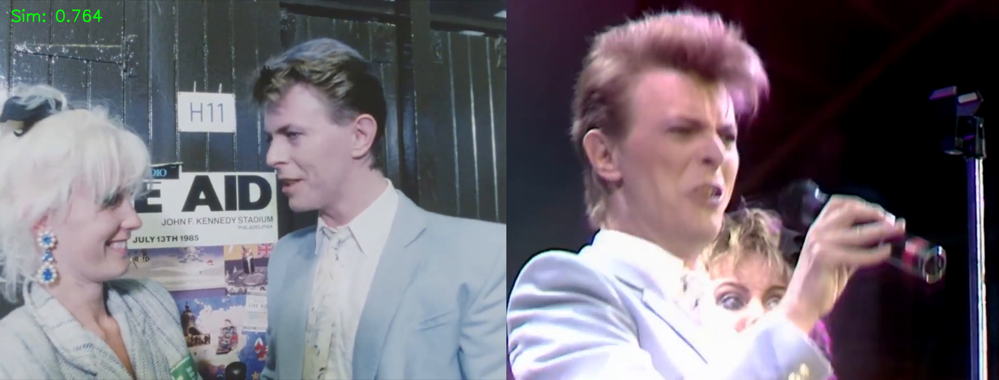


Match 2


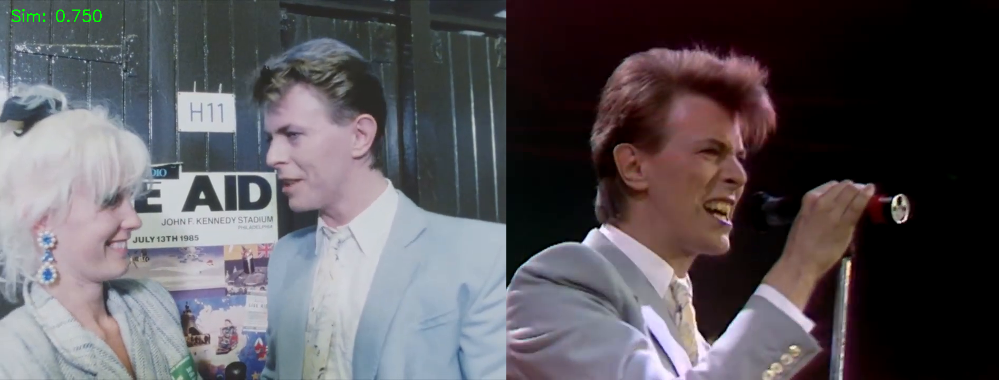


Match 3


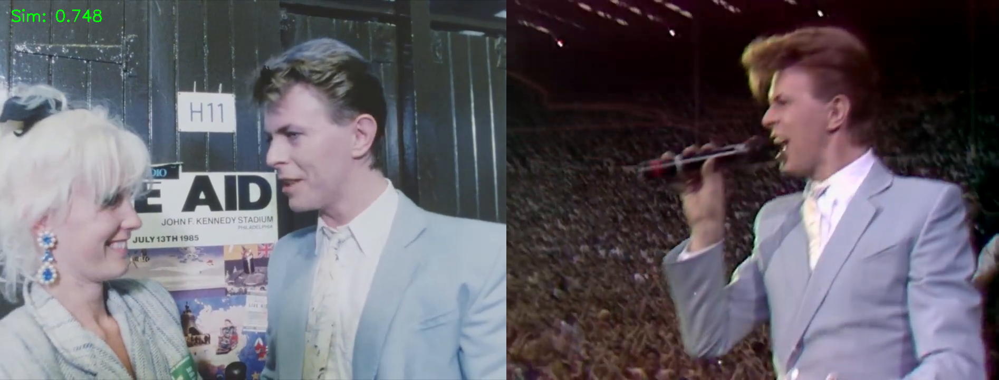


Match 4


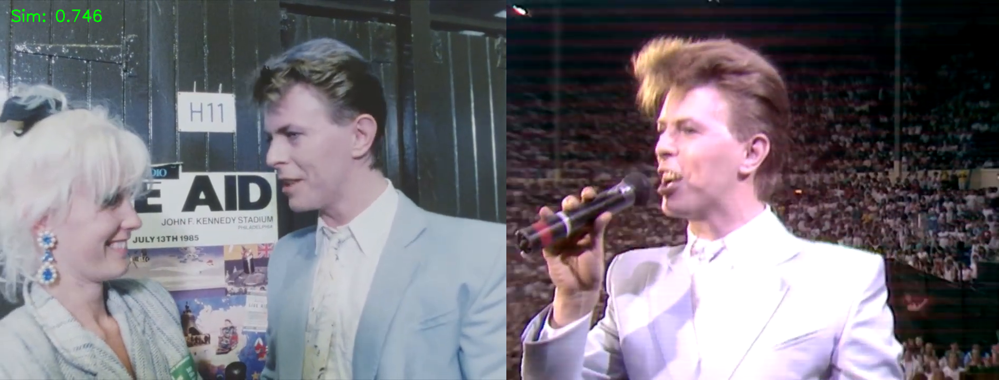


Match 5


In [ ]:
# -----------------------------
# 1️⃣ Extract and load tracks
# -----------------------------


# if cache tracks dont load, extract them.

print("\n🔍 Extracting query video...")
query_video_emb = get_video_embedding(QUERY_VIDEO)

print("\n🔍 Extracting target video...")
target_video_emb = get_video_embedding(TARGET_VIDEO)


query_tracks = load_tracks(get_video_hash(QUERY_VIDEO))
target_tracks = load_tracks(get_video_hash(TARGET_VIDEO))

print(f"\nQuery tracks: {len(query_tracks)}")
print(f"Target tracks: {len(target_tracks)}")

if not query_tracks or not target_tracks:
    raise RuntimeError("No valid tracks found.")


# -----------------------------
# 2️⃣ TRACK-TO-TRACK SIMILARITY (FOR VISUALIZATION)
# -----------------------------

from sklearn.metrics.pairwise import cosine_similarity

TOP_K = 5  # number of top matches to visualize

# Convert track embeddings to arrays
q_embs = np.array([t["embedding"] for t in query_tracks])
t_embs = np.array([t["embedding"] for t in target_tracks])

# Compute similarity matrix
sim_matrix = cosine_similarity(q_embs, t_embs)

pairs = []

for i, q in enumerate(query_tracks):
    for j, t in enumerate(target_tracks):
        pairs.append({
            "q_frame": q["rep_frame"],
            "t_frame": t["rep_frame"],
            "similarity": float(sim_matrix[i, j])
        })

# Sort by similarity descending
pairs = sorted(pairs, key=lambda x: x["similarity"], reverse=True)[:TOP_K]

print("\n🔝 Top Track Matches:")
for idx, p in enumerate(pairs):
    print(f"{idx+1}. Sim={p['similarity']:.3f} | "
          f"Query Frame={p['q_frame']} | Target Frame={p['t_frame']}")


# -----------------------------
# 3.  VIDEO-LEVEL SIMILARITY (DOMINANT-LEVEL AGGREGATION)
# -----------------------------

video_similarity = np.max(sim_matrix)
print(f"\n🎯 Video-to-Video Similarity: {video_similarity:.3f}")


# -----------------------------
# 4. VISUALIZATION
# -----------------------------

cap_q = cv2.VideoCapture(QUERY_VIDEO)
cap_t = cv2.VideoCapture(TARGET_VIDEO)

for idx, p in enumerate(pairs):

    cap_q.set(cv2.CAP_PROP_POS_FRAMES, p["q_frame"])
    cap_t.set(cv2.CAP_PROP_POS_FRAMES, p["t_frame"])

    ok_q, fq = cap_q.read()
    ok_t, ft = cap_t.read()

    if not ok_q or not ok_t:
        continue

    # Resize to same height
    h = min(fq.shape[0], ft.shape[0])
    fq = cv2.resize(fq, (int(fq.shape[1] * h / fq.shape[0]), h))
    ft = cv2.resize(ft, (int(ft.shape[1] * h / ft.shape[0]), h))

    out = np.hstack((fq, ft))

    cv2.putText(
        out,
        f"Sim: {p['similarity']:.3f}",
        (20, 40),
        cv2.FONT_HERSHEY_SIMPLEX,
        1,
        (0, 255, 0),
        2
    )

    print(f"\nMatch {idx + 1}")
    cv2_imshow(out)

cap_q.release()
cap_t.release()

# -----------------------------
# 5. FINAL DECISION
# -----------------------------
VIDEO_MATCH_THRESHOLD = 0.25  # for buffalo_l

if video_similarity >= VIDEO_MATCH_THRESHOLD:
    print("\n✅ SAME PERSON APPEARS IN BOTH VIDEOS")
else:
    print("\n❌ DIFFERENT PERSONS")


!zip -r /content/face_cache.zip /content/face_cache

In [ ]:
print(np.max(sim_matrix))
print(np.mean(sim_matrix))


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Video frame embeddings
q_embs = np.vstack([t["embedding"] for t in query_tracks])   # (F, 512)

# Enrolled image embeddings
img_embs = np.vstack(image_df["embedding"].values)           # (N, 512)


sim_matrix = cosine_similarity(q_embs, img_embs)


pairs = []

for i, q in enumerate(query_tracks):
    for j, row in image_df.iterrows():
        pairs.append({
            "video_frame": q["rep_frame"],
            "track_id": q["track_id"],
            "person": row["person"],      # ✅ identity
            "image_path": row["path"],    # ✅ image reference
            "similarity": float(sim_matrix[i, j])
        })

pairs_df = pd.DataFrame(pairs)


TOP_K = 5

top_frame_matches = (
    pairs_df
    .sort_values("similarity", ascending=False)
    .head(TOP_K)
)

print("\n🔝 Top frame ↔ image matches:")
print(top_frame_matches)


identity_scores = (
    pairs_df
    .groupby("person")["similarity"]
    .apply(lambda x: np.mean(np.sort(x)[-5:]))  # top-5 mean
    .sort_values(ascending=False)
)

print("\n🧠 Identity ranking:")
print(identity_scores.head(5))




🔝 Top frame ↔ image matches:
     video_frame  track_id         person  \
67            55         0  Ozzy Osbourne   
255          382         3  Ozzy Osbourne   
258          382         3  Ozzy Osbourne   
263          382         3  Ozzy Osbourne   
59            55         0  Ozzy Osbourne   

                                            image_path  similarity  
67   /content/sample dataset/Ozzy Osbourne/ozzy osb...    0.420207  
255  /content/sample dataset/Ozzy Osbourne/ozzy osb...    0.402300  
258  /content/sample dataset/Ozzy Osbourne/ozzy osb...    0.391005  
263  /content/sample dataset/Ozzy Osbourne/ozzy osb...    0.388751  
59   /content/sample dataset/Ozzy Osbourne/ozzy osb...    0.383675  

🧠 Identity ranking:
person
Ozzy Osbourne      0.397188
Serj Tankian       0.145716
Brian May          0.138736
Freddie Mercury    0.131374
Lady Gaga          0.128177
Name: similarity, dtype: float64


In [ ]:
print(image_df.columns.tolist())


['person', 'embedding', 'path']
